<a href="https://colab.research.google.com/github/kodindonesia/kicolab_Manuals/blob/master/02_Manual_Style_Transfer_helper_kicolab.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# download Kodindonesia Colab helpers
!git clone https://github.com/kodindonesia/kicolab.git     &> /dev/null

In [2]:
# import Kodindonesia helpers in Python
from kicolab.style_transfer_helper import Style_transfer                  

# helper used to create a video at the end of this notebook, and to increase image size
from kicolab.image_helper import Image_Super_Resolution, Cv_image         
from kicolab.cvhelper import Video_cv                                   

In [3]:
style_location = 'https://i.pinimg.com/originals/2d/e4/00/2de400f3b064b9aba83169f202e62d44.jpg' # starry night

st = Style_transfer(style_location, fastest=False) # gets ready to do style transfer (this setup can take some seconds)

155648/154210 [==============================] - 0s 0us/step


98304/96192 [==============================] - 0s 0us/step


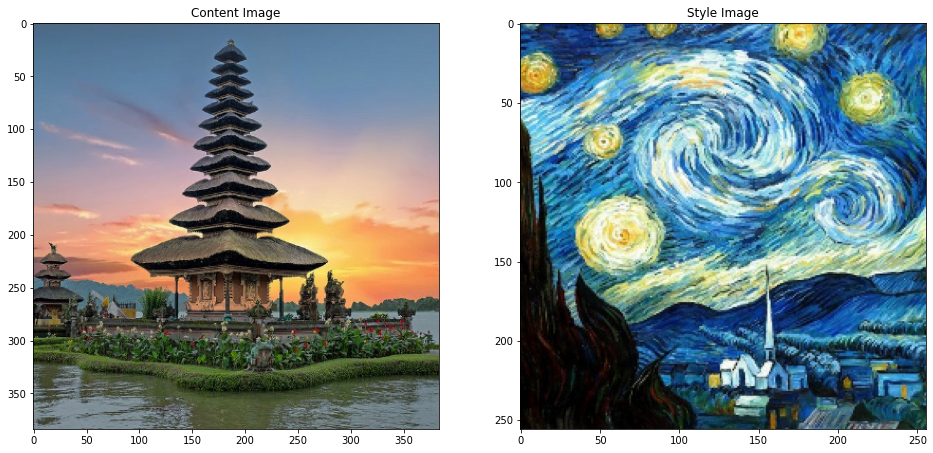

In [4]:
#content_location = 'https://storage.googleapis.com/khanhlvg-public.appspot.com/arbitrary-style-transfer/belfry-2611573_1280.jpg'
# content_location = 'https://www.history.com/.image/ar_1:1%2Cc_fill%2Ccs_srgb%2Cfl_progressive%2Cq_auto:good%2Cw_1200/MTU3ODc4NjAzNTM2MTQ4MTkx/hith-eiffel-tower-istock_000016468972large-2.jpg'
content_location = 'https://i.pinimg.com/originals/83/ec/e6/83ece611c1376d026a03d2749f51d15f.jpg' # Indonesian Ulan-Danu-Temple

st.set_content(content_location)
st.show_content_and_style()

In [5]:
st.create_stylized_image() # to apply the painting style to the content photo

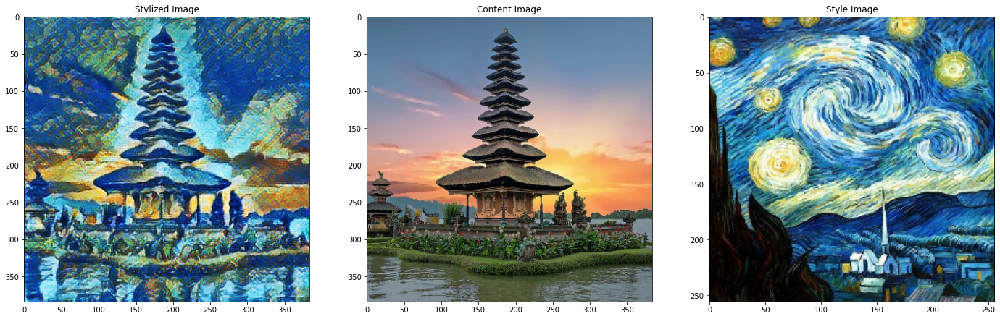

In [6]:
st.show_stylized_and_content_and_style()

In [7]:
st.create_stylized_and_content_image_blend(0.90) # 90% close to the original (meaning only 10% of the fulky stylesed above)

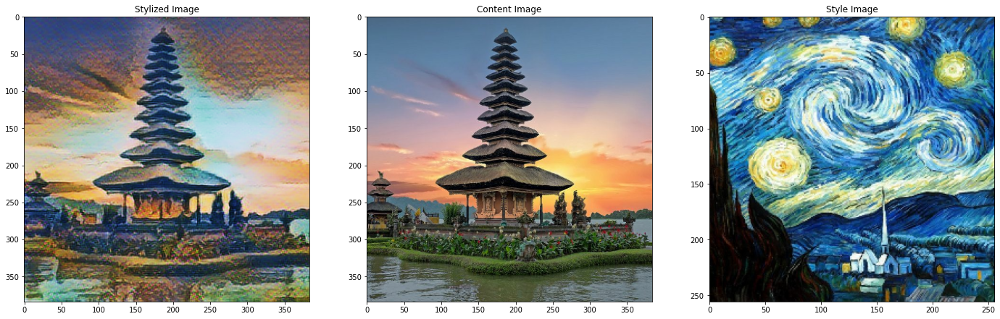

In [8]:
st.show_stylized_and_content_and_style()

# Combining other Kodindonesia helper tools

## Make videos

1269760/1263641 [==============================] - 4s 4us/step


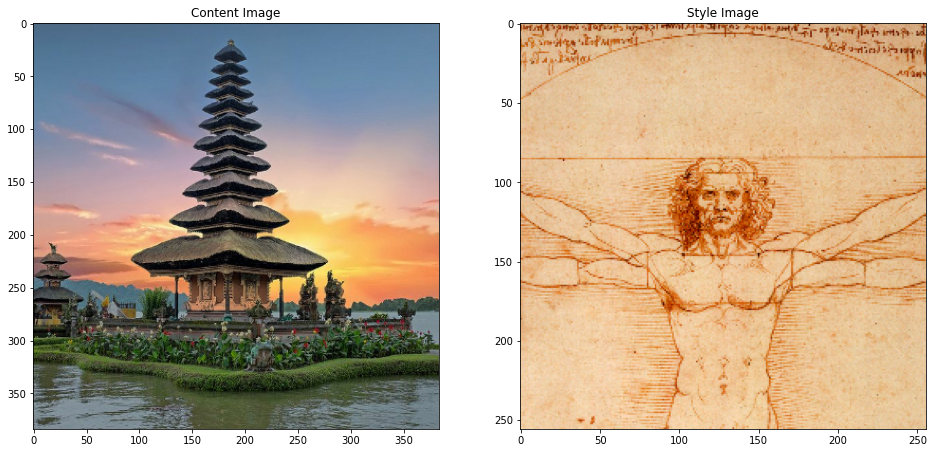

In [9]:
#set style to Italian Reinaissance pencil drawings
style_location = 'https://lifeskills.ge/wp-content/uploads/2019/06/DqIof7-onlpXioD-vItQxg_Leonardothumb800.jpg' # Leonardo da Vinci
st.set_style(style_location)
st.show_content_and_style()

In [ ]:
# create video
import numpy as np

def content():  
  return st.get_opencv_content()

def stylized():  
  st.create_stylized_image()
  return st.get_opencv_stylized()

def stylized_blend(percentage):
  st.create_stylized_and_content_image_blend(percentage)
  return st.get_opencv_stylized()

def create_video(video_name='style-transfer', frames_num=10, fps=10, download=False):
  cvimg = content()
  vid = Video_cv(fps, video_name, frame=cvimg) # set video size
  vid.write_frame(cvimg) # write 1st frame as content
  for percentage in np.linspace(.05, .9999, frames_num):
    vid.write_frame( stylized_blend(1-percentage) ) # write intermediate frames
  vid.write_frame( stylized() ) # write last frame as fully stylized
  vid.end_video(download=download, show=False) 
  return vid


create_video('small', frames_num=24, fps=3).show()

## Increase image size by 4x using Artificial Intelligence

98304/95965 [==============================] - 0s 0us/step


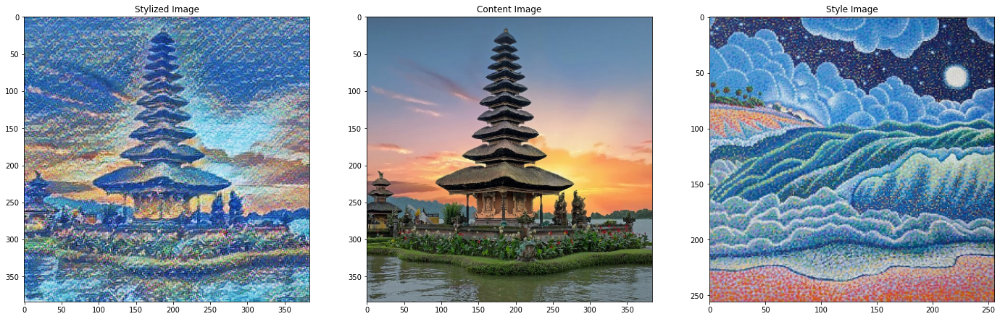

In [11]:
style_location = 'https://images.template.net/wp-content/uploads/2014/11/Pointillist-Wave-Beach-Scene.jpg' # Pointillist
st.set_style(style_location)
st.create_stylized_image()
st.show_stylized_and_content_and_style()

Downloaded https://tfhub.dev/captain-pool/esrgan-tf2/1, Total size: 20.60MB

(1536, 1536, 3)


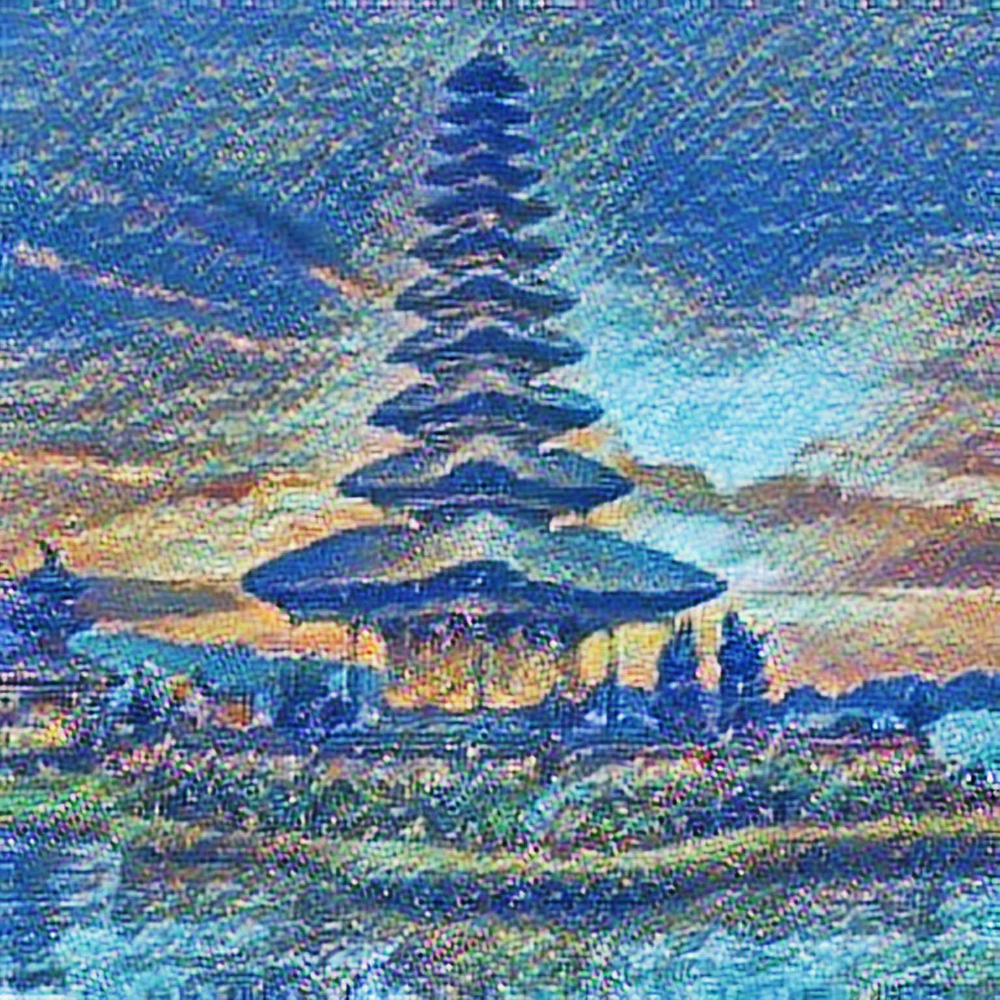

In [12]:
# use Artitificial Intelligence (Deep Learning) to upscsale an image by 4 times
ai_upscaler = Image_Super_Resolution() # (this setup can take some seconds)

cv_img = st.get_opencv_stylized() # get stylized image in the OpenCV image format
big_cv_img = ai_upscaler.get_cvimage_upscaled4x( cv_img  ) # upscale 4x
# show image and its size
print(big_cv_img.shape)
Cv_image.show(big_cv_img) # show OpenCV image in Colab

114688/108525 [===============================] - 0s 0us/step


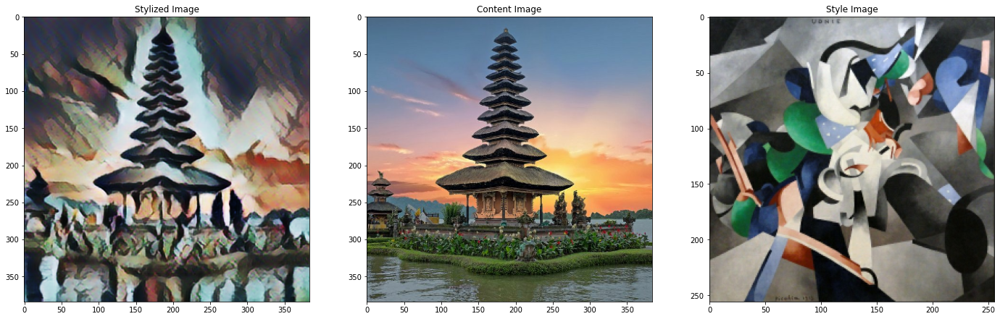

In [13]:
style_location = 'https://storage.googleapis.com/khanhlvg-public.appspot.com/arbitrary-style-transfer/style23.jpg' # abstract
st.set_style(style_location)
st.create_stylized_image()
st.show_stylized_and_content_and_style()

(722, 722, 3)


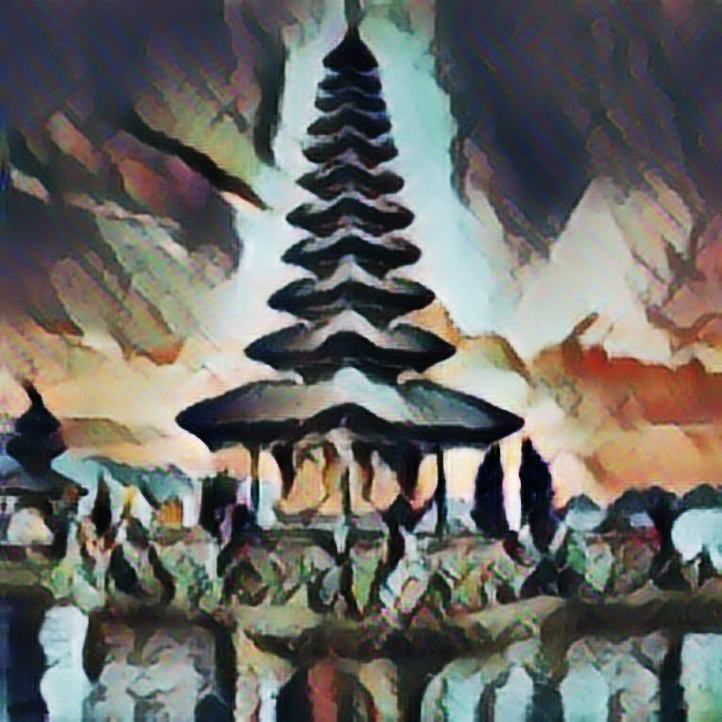

In [14]:
cv_img = st.get_opencv_stylized() # get stylized image in the OpenCV image format

big_cv_img = ai_upscaler.get_cvimage_upscaled4x( cv_img  ) # upscale 4x

medium_cv_img = Cv_image.resize(big_cv_img, 0.47) # resize without AI: useful to reduce the size of an image, and very fast

# show image and its size
print(medium_cv_img.shape)
Cv_image.show(medium_cv_img) # show OpenCV image in Colab

Cv_image.write(medium_cv_img, 'indo_abstract.png') # save the image to a file, so that you can download it